INTRO TO ML & ITS ROLE IN DATA ANALYSIS

TYPES OF MACHINE LEARNING - SUPERVISED, UNSUPERVISED & REINFORCEMENT 

DATA PREPROCCESING - HANDLING THE MISSING VALUES, OUTLIER & METHODS TO HANDLE OUTLIERS - IQR METHOD & Z METHOD

FEATURE SCALING

LINEAR REGRESSION AS REGRESSION TECHNIQUE

SIMPLE LINEAR REGRESSION

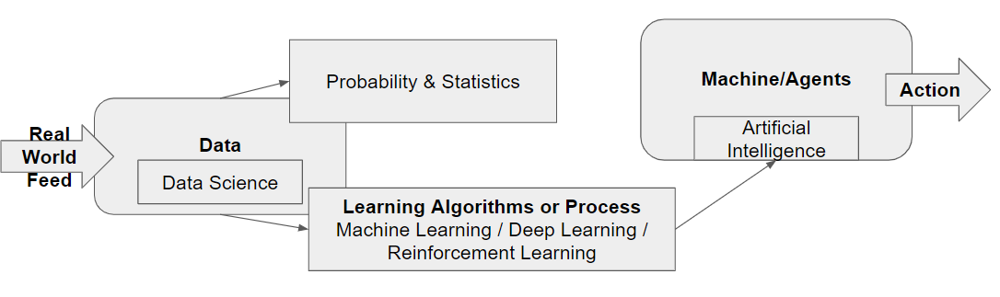

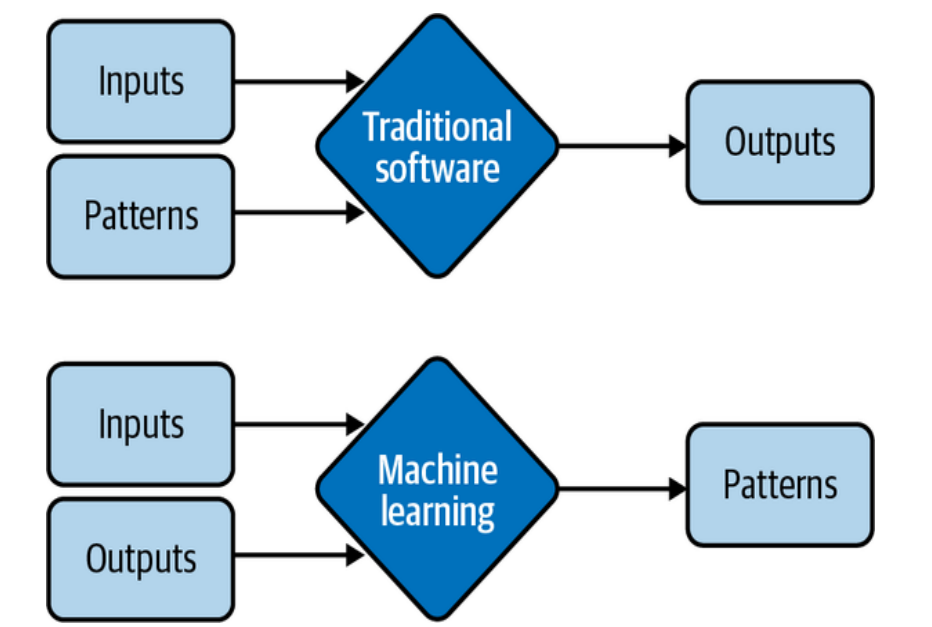

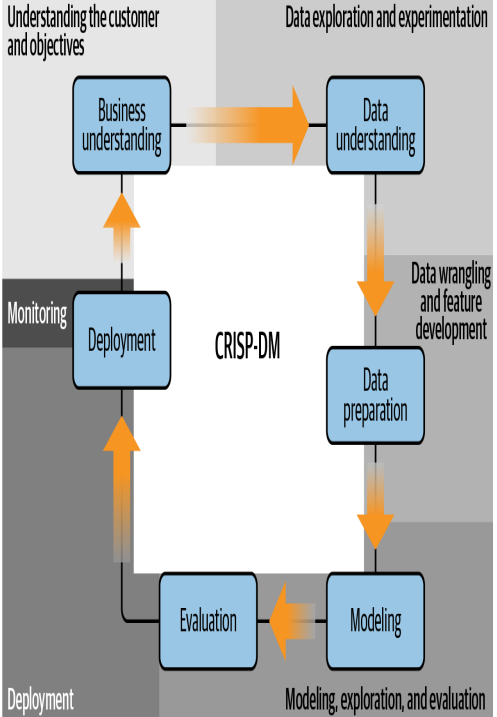

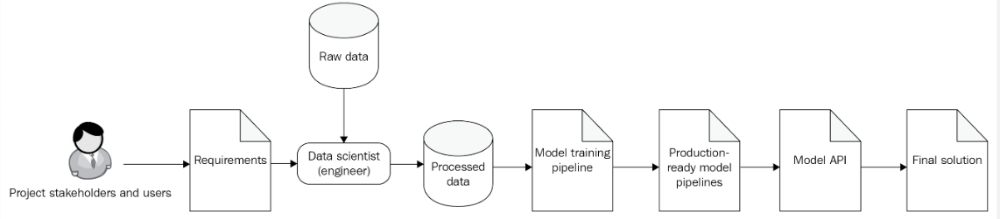

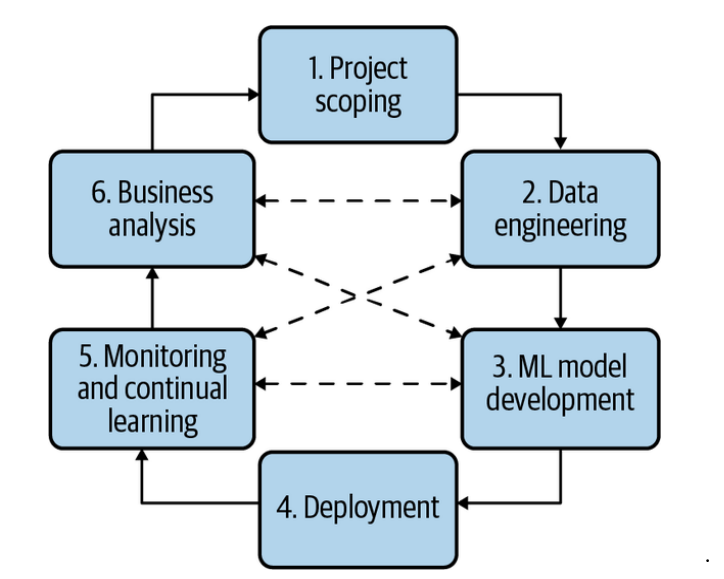

...

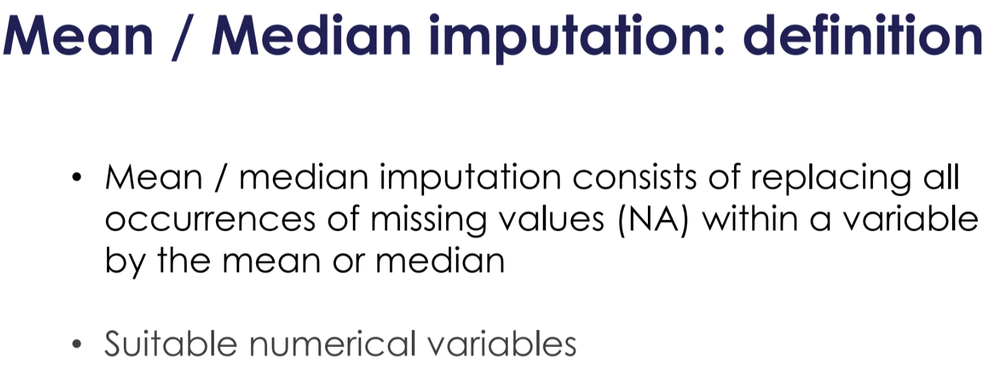

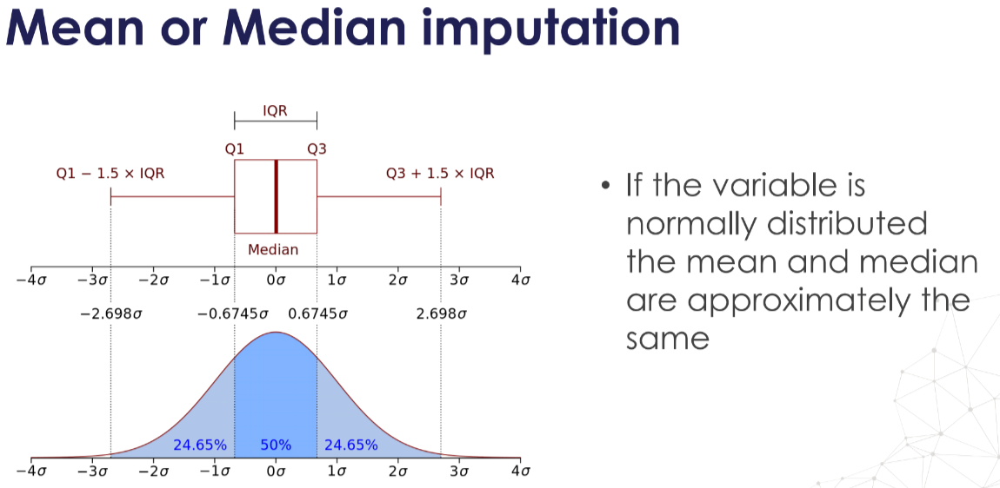

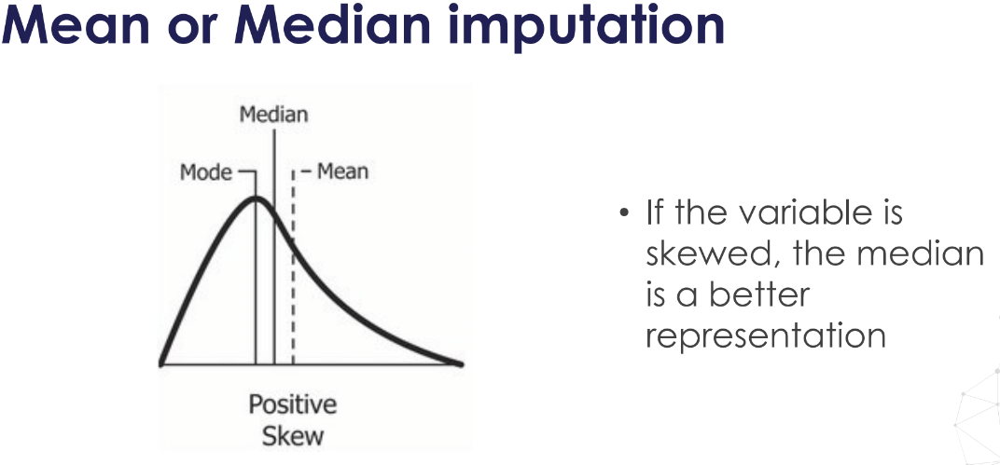

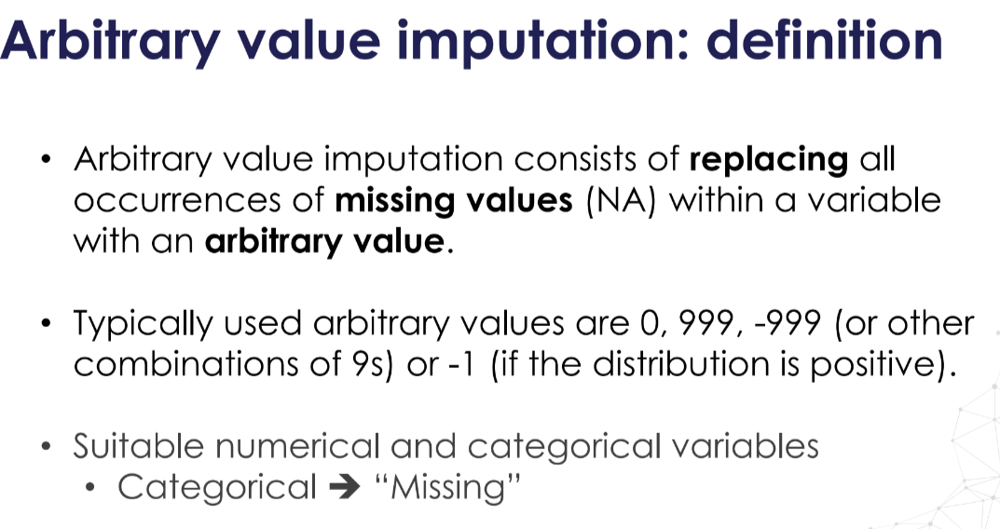

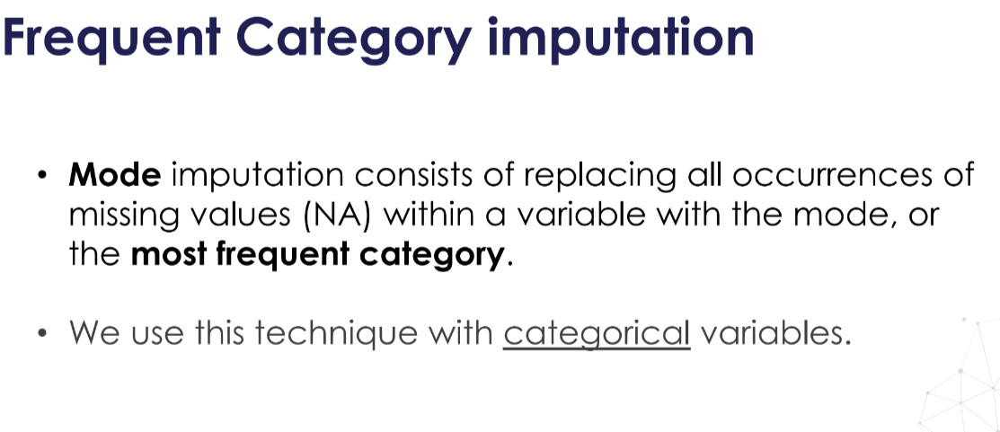

In [3]:
import pandas as pd
import matplotlib.pyplot as plt

# transformers to impute missing data with sklearn:

from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

# to split the datasets
from sklearn.model_selection import train_test_split

In [4]:
# We use only the following variables for the demo

cols_to_use = [
    "OverallQual",
    "TotalBsmtSF",
    "1stFlrSF",
    "GrLivArea",
    "WoodDeckSF",
    "BsmtUnfSF",
    "LotFrontage",
    "MasVnrArea",
    "GarageYrBlt",
    "SalePrice",
]

In [15]:
# let's load the House Prices dataset

data = pd.read_csv(".\Datasets\houseprice.csv.csv", usecols=cols_to_use)

# Get rows where any cell has a null value
null_data = data[data.isnull().any(axis=1)]

# Get a sample of 5 rows with null values
sample_null_data = null_data.sample(5)
sample_null_data

,LotFrontage,OverallQual,MasVnrArea,BsmtUnfSF,TotalBsmtSF,1stFlrSF,GrLivArea,GarageYrBlt,WoodDeckSF,SalePrice
1449,21.0,5,0.0,77,630,630,630,NaN,0,92000
1354,NaN,7,0.0,257,992,992,1865,2000.0,0,235000
140,70.0,4,0.0,432,864,864,864,NaN,0,115000
1084,NaN,6,0.0,99,691,691,1498,1995.0,315,187500
1247,NaN,6,335.0,473,1012,1034,1034,1976.0,0,169900


In [16]:
# Query the original DataFrame using the indexes from sample_null_data
queried_data = data.loc[sample_null_data.index]
queried_data

,LotFrontage,OverallQual,MasVnrArea,BsmtUnfSF,TotalBsmtSF,1stFlrSF,GrLivArea,GarageYrBlt,WoodDeckSF,SalePrice
1449,21.0,5,0.0,77,630,630,630,NaN,0,92000
1354,NaN,7,0.0,257,992,992,1865,2000.0,0,235000
140,70.0,4,0.0,432,864,864,864,NaN,0,115000
1084,NaN,6,0.0,99,691,691,1498,1995.0,315,187500
1247,NaN,6,335.0,473,1012,1034,1034,1976.0,0,169900


In [17]:
# Set up the simple imputer to impute with the median.

imputer = SimpleImputer(strategy="median")

# We fit the imputer to the train set.
# The imputer will learn the median of all variables.

imputer.fit(data)
print(  imputer.statistics_)
data_median = imputer.transform(queried_data)
pd.DataFrame(data_median)

[6.900e+01 6.000e+00 0.000e+00 4.775e+02 9.915e+02 1.087e+03 1.464e+03
 1.980e+03 0.000e+00 1.630e+05]


,0,1,2,3,4,5,6,7,8,9
0,21.0,5.0,0.0,77.0,630.0,630.0,630.0,1980.0,0.0,92000.0
1,69.0,7.0,0.0,257.0,992.0,992.0,1865.0,2000.0,0.0,235000.0
2,70.0,4.0,0.0,432.0,864.0,864.0,864.0,1980.0,0.0,115000.0
3,69.0,6.0,0.0,99.0,691.0,691.0,1498.0,1995.0,315.0,187500.0
4,69.0,6.0,335.0,473.0,1012.0,1034.0,1034.0,1976.0,0.0,169900.0


In [18]:
imputer = SimpleImputer(strategy="mean").set_output(transform="pandas")
imputer.fit(data)
imputer.statistics_
print(  imputer.statistics_)
data_mean = imputer.transform(queried_data)
pd.DataFrame(data_mean)


[7.00499584e+01 6.09931507e+00 1.03685262e+02 5.67240411e+02
 1.05742945e+03 1.16262671e+03 1.51546370e+03 1.97850616e+03
 9.42445205e+01 1.80921196e+05]


,LotFrontage,OverallQual,MasVnrArea,BsmtUnfSF,TotalBsmtSF,1stFlrSF,GrLivArea,GarageYrBlt,WoodDeckSF,SalePrice
1449,21.000000,5.0,0.0,77.0,630.0,630.0,630.0,1978.506164,0.0,92000.0
1354,70.049958,7.0,0.0,257.0,992.0,992.0,1865.0,2000.000000,0.0,235000.0
140,70.000000,4.0,0.0,432.0,864.0,864.0,864.0,1978.506164,0.0,115000.0
1084,70.049958,6.0,0.0,99.0,691.0,691.0,1498.0,1995.000000,315.0,187500.0
1247,70.049958,6.0,335.0,473.0,1012.0,1034.0,1034.0,1976.000000,0.0,169900.0


In [19]:
imputer = SimpleImputer(strategy="most_frequent").set_output(transform="pandas")
imputer.fit(data)
imputer.statistics_
print(  imputer.statistics_)
data_freq = imputer.transform(queried_data)
pd.DataFrame(data_freq)

[6.000e+01 5.000e+00 0.000e+00 0.000e+00 0.000e+00 8.640e+02 8.640e+02
 2.005e+03 0.000e+00 1.400e+05]


,LotFrontage,OverallQual,MasVnrArea,BsmtUnfSF,TotalBsmtSF,1stFlrSF,GrLivArea,GarageYrBlt,WoodDeckSF,SalePrice
1449,21.0,5.0,0.0,77.0,630.0,630.0,630.0,2005.0,0.0,92000.0
1354,60.0,7.0,0.0,257.0,992.0,992.0,1865.0,2000.0,0.0,235000.0
140,70.0,4.0,0.0,432.0,864.0,864.0,864.0,2005.0,0.0,115000.0
1084,60.0,6.0,0.0,99.0,691.0,691.0,1498.0,1995.0,315.0,187500.0
1247,60.0,6.0,335.0,473.0,1012.0,1034.0,1034.0,1976.0,0.0,169900.0


In [21]:
cols_to_use = [
    "LotFrontage",
    "BsmtQual",
    "FireplaceQu",
    "SalePrice",
]

data = pd.read_csv(".\Datasets\houseprice.csv.csv", usecols=cols_to_use)

# Get rows where any cell has a null value
null_data = data[data.isnull().any(axis=1)]

In [23]:
data["BsmtQual"].unique()

array(['Gd', 'TA', 'Ex', nan, 'Fa'], dtype=object)

In [24]:
data["FireplaceQu"].unique()

array([nan, 'TA', 'Gd', 'Fa', 'Ex', 'Po'], dtype=object)

In [25]:
# Get a sample of 5 rows with null values
sample_null_data = null_data.sample(5)
# Query the original DataFrame using the indexes from sample_null_data
queried_data = data.loc[sample_null_data.index]
queried_data

,LotFrontage,BsmtQual,FireplaceQu,SalePrice
1193,NaN,Ex,NaN,165000
725,60.0,TA,NaN,120500
342,NaN,NaN,NaN,87500
1260,NaN,Gd,TA,181000
407,63.0,Gd,NaN,177000


In [26]:
imputer = SimpleImputer(
    strategy="constant",
    fill_value="Missing",
)
# we fit the imputer to the train set
imputer.fit(data)
print(  imputer.statistics_)
data_constant = imputer.transform(queried_data)
pd.DataFrame(data_constant)

['Missing' 'Missing' 'Missing' 'Missing']


,0,1,2,3
0,Missing,Ex,Missing,165000
1,60.0,TA,Missing,120500
2,Missing,Missing,Missing,87500
3,Missing,Gd,TA,181000
4,63.0,Gd,Missing,177000


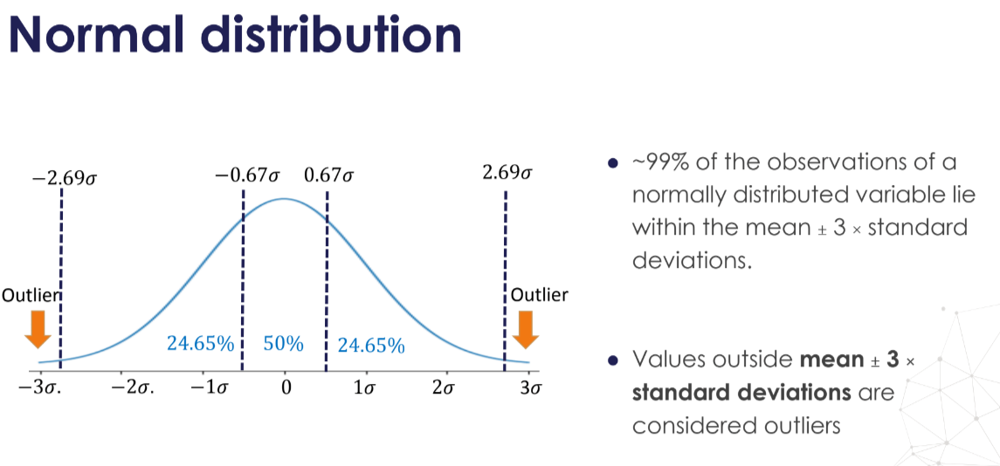

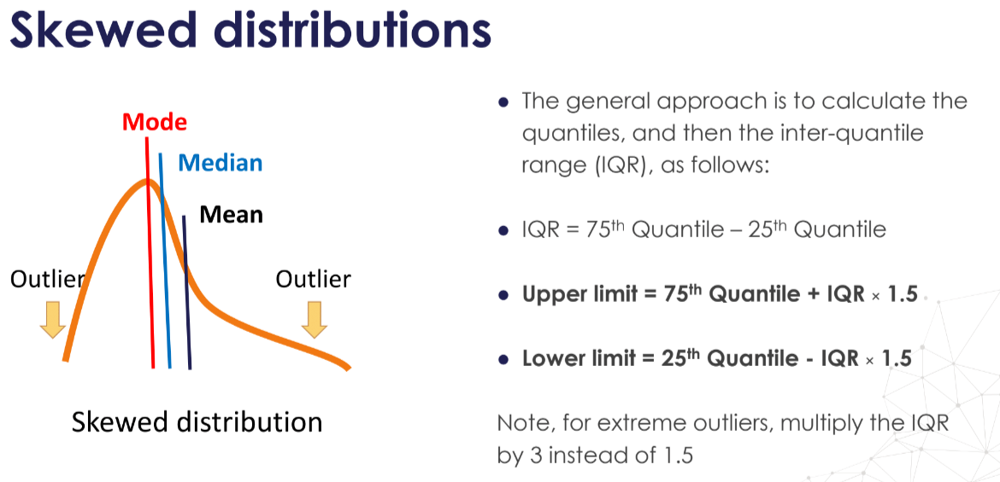

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.datasets import load_breast_cancer

# load the California House price data from Scikit-learn
breast_cancer = load_breast_cancer()
X = pd.DataFrame(breast_cancer.data, columns=breast_cancer.feature_names)
y = breast_cancer.target

# let's separate the data into training and testing sets

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.3,
    random_state=0,
)

X_train.shape, X_test.shape

((398, 30), (171, 30))

In [32]:
X_train.sample(5)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
16,14.68,20.13,94.74,684.5,0.09867,0.07200,0.07395,0.05259,0.1586,0.05922,...,19.07,30.88,123.40,1138.0,0.1464,0.1871,0.29140,0.16090,0.3029,0.08216
349,11.95,14.96,77.23,426.7,0.11580,0.12060,0.01171,0.01787,0.2459,0.06581,...,12.81,17.72,83.09,496.2,0.1293,0.1885,0.03122,0.04766,0.3124,0.07590
253,17.30,17.08,113.00,928.2,0.10080,0.10410,0.12660,0.08353,0.1813,0.05613,...,19.85,25.09,130.90,1222.0,0.1416,0.2405,0.33780,0.18570,0.3138,0.08113
494,13.16,20.54,84.06,538.7,0.07335,0.05275,0.01800,0.01256,0.1713,0.05888,...,14.50,28.46,95.29,648.3,0.1118,0.1646,0.07698,0.04195,0.2687,0.07429
511,14.81,14.70,94.66,680.7,0.08472,0.05016,0.03416,0.02541,0.1659,0.05348,...,15.61,17.58,101.70,760.2,0.1139,0.1011,0.11010,0.07955,0.2334,0.06142


In [29]:
def plot_boxplot_and_hist(data, variable):
    
    # creating a figure composed of two matplotlib.Axes 
    # objects (ax_box and ax_hist)
    
    f, (ax_box, ax_hist) = plt.subplots(
        2, sharex=True, gridspec_kw={"height_ratios": (0.50, 0.85)}
    )

    # assigning a graph to each ax
    sns.boxplot(x=data[variable], ax=ax_box)
    sns.histplot(data=data, x=variable, ax=ax_hist)

    # Remove x axis name for the boxplot
    ax_box.set(xlabel="")
    plt.title(variable)
    plt.show()

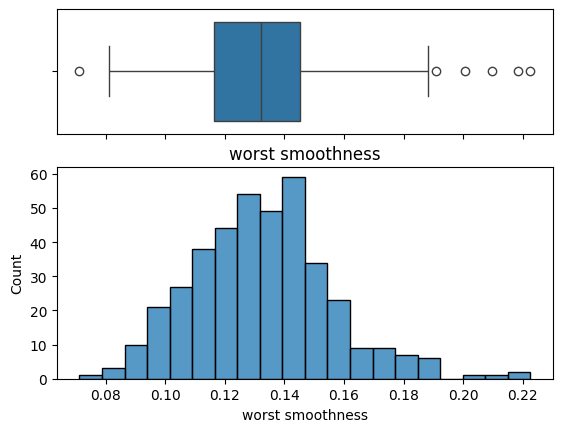

In [30]:
plot_boxplot_and_hist(X_train, "worst smoothness")

In [33]:
def find_limits(df, variable, fold):

    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_limit = df[variable].quantile(0.25) - (IQR * fold)
    upper_limit = df[variable].quantile(0.75) + (IQR * fold)

    return lower_limit, upper_limit

In [34]:

lower_limit, upper_limit = find_limits(X_train, "worst smoothness", 1.5)
lower_limit, upper_limit

(0.07283749999999997, 0.18873750000000003)

In [35]:
def find_limits(df, variable):
    lower_limit = X_train[variable].quantile(0.05)
    upper_limit = X_train[variable].quantile(0.95)
    return lower_limit, upper_limit

In [36]:
# we find the limits

lower_limit, upper_limit = find_limits(X_train, "worst smoothness")
lower_limit, upper_limit

(0.0960535, 0.17321499999999998)

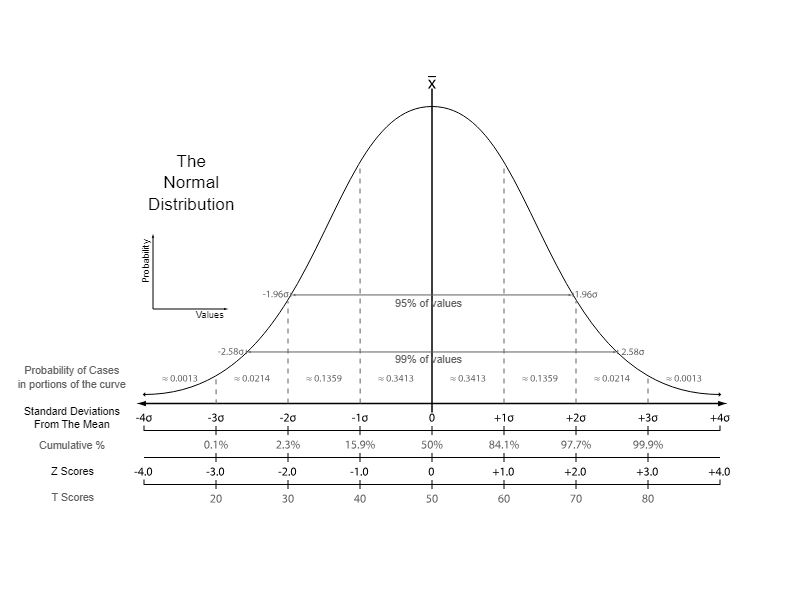

In [39]:
from scipy import stats
import numpy as np

def handle_outliers_z_score(df, variable, threshold=3):
    z_scores = np.abs(stats.zscore(df[variable]))
    return z_scores

z_score = handle_outliers_z_score(X_train, "worst smoothness")

#get p value
p_values = stats.norm.sf(abs(z_score))
len(p_values)



398

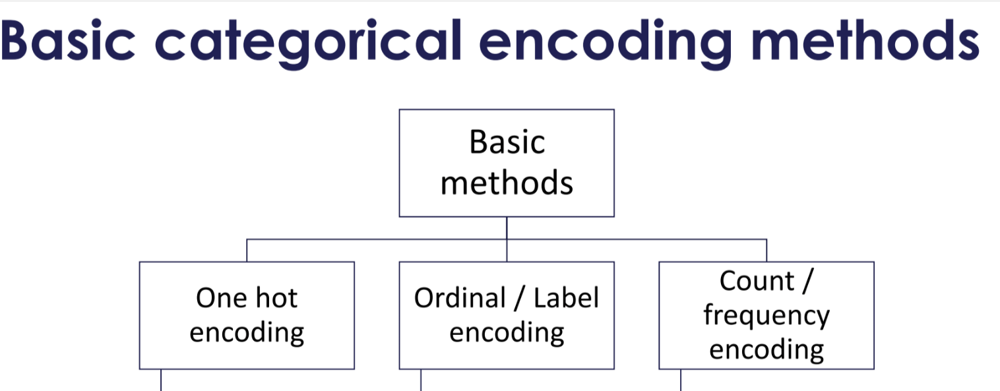

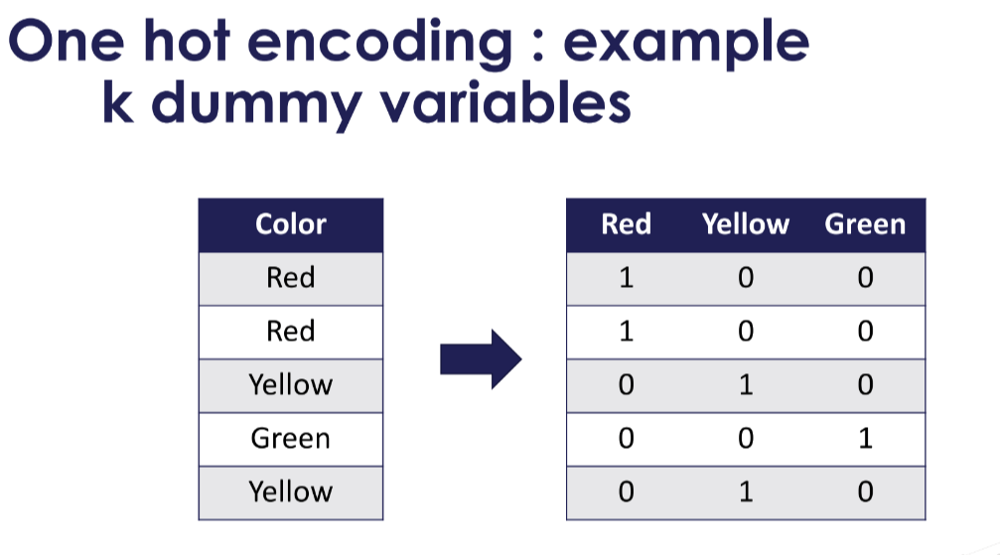

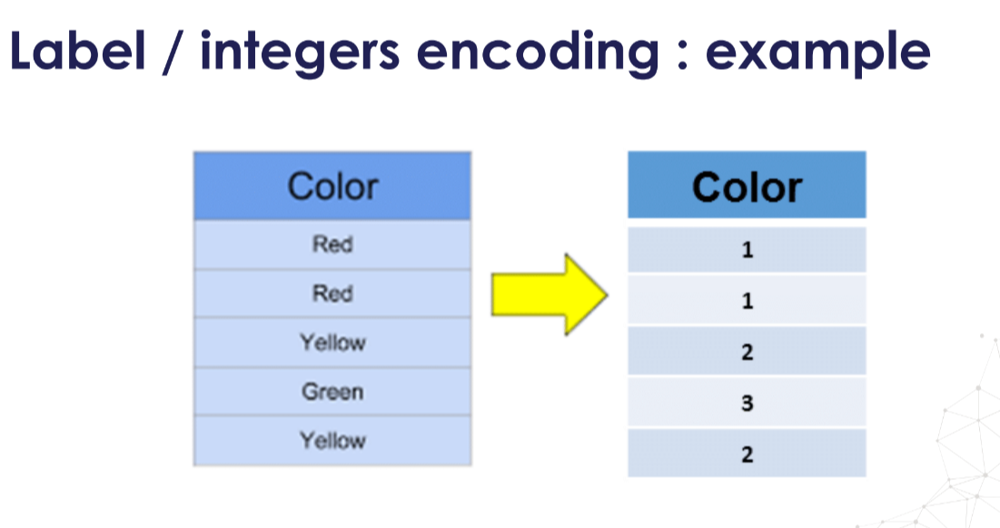

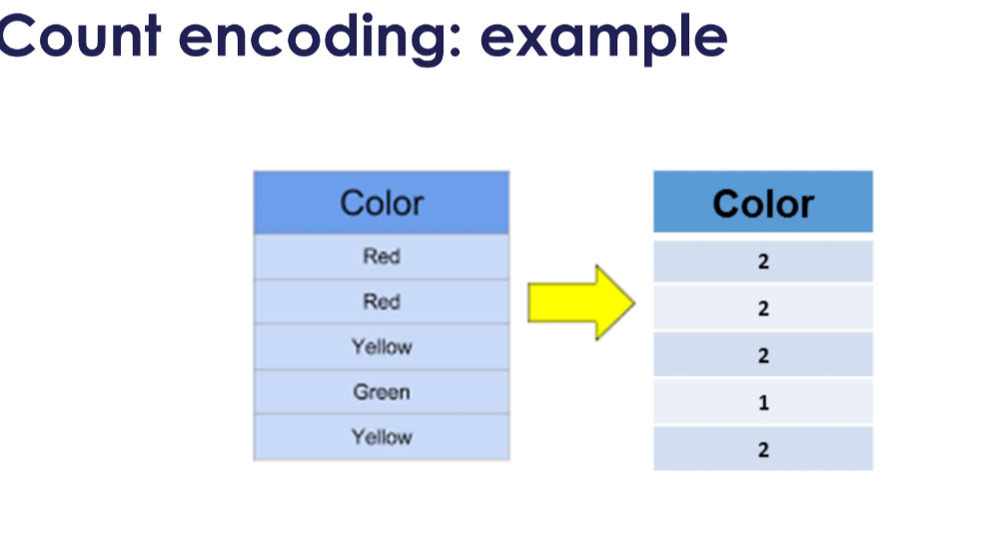

In [40]:
import pandas as pd
from sklearn.model_selection import train_test_split

# sklearn
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder

In [42]:
# load titanic dataset

usecols = ["pclass", "sibsp", "parch", "sex", "embarked", "cabin", "survived"]

data = pd.read_csv("./Datasets/titanic.csv", usecols=usecols)
data["cabin"] = data["cabin"].str[0]

data.head()

,pclass,survived,sex,sibsp,parch,cabin,embarked
0,1,1,female,0,0,B,S
1,1,1,male,1,2,C,S
2,1,0,female,1,2,C,S
3,1,0,male,1,2,C,S
4,1,0,female,1,2,C,S


In [50]:
# set up encoder

encoder = OneHotEncoder(
    categories="auto",
    drop="first",  # to return k-1, use drop=false to return k dummies
    sparse_output=False,
    handle_unknown="error",  # helps deal with rare labels
)

encoder.set_output(transform="pandas")

encoder.fit(data)
X_enc = encoder.transform(data)
display(X_enc.sample(5))
display(encoder.get_feature_names_out())


,pclass_2,pclass_3,survived_1,sex_male,sibsp_1,sibsp_2,sibsp_3,sibsp_4,sibsp_5,sibsp_8,...,cabin_C,cabin_D,cabin_E,cabin_F,cabin_G,cabin_T,cabin_nan,embarked_Q,embarked_S,embarked_nan
890,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
213,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
512,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
101,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
405,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


array(['pclass_2', 'pclass_3', 'survived_1', 'sex_male', 'sibsp_1',
       'sibsp_2', 'sibsp_3', 'sibsp_4', 'sibsp_5', 'sibsp_8', 'parch_1',
       'parch_2', 'parch_3', 'parch_4', 'parch_5', 'parch_6', 'parch_9',
       'cabin_B', 'cabin_C', 'cabin_D', 'cabin_E', 'cabin_F', 'cabin_G',
       'cabin_T', 'cabin_nan', 'embarked_Q', 'embarked_S', 'embarked_nan'],
      dtype=object)

In [52]:
from sklearn.preprocessing import OrdinalEncoder

data = pd.read_csv(
    "./Datasets/houseprice.csv",
    usecols=["Neighborhood", "Exterior1st", "Exterior2nd", "SalePrice"],
)

data.head()

,Neighborhood,Exterior1st,Exterior2nd,SalePrice
0,CollgCr,VinylSd,VinylSd,208500
1,Veenker,MetalSd,MetalSd,181500
2,CollgCr,VinylSd,VinylSd,223500
3,Crawfor,Wd Sdng,Wd Shng,140000
4,NoRidge,VinylSd,VinylSd,250000


In [54]:
for col in data.columns:
    print(col, ": ", len(data[col].unique()), " labels")

Neighborhood :  25  labels
Exterior1st :  15  labels
Exterior2nd :  16  labels
SalePrice :  663  labels


In [56]:
# let's find the categorical variables

cat_vars = list(data.select_dtypes(include="O").columns)
cat_vars

['Neighborhood', 'Exterior1st', 'Exterior2nd']

In [57]:
encoder = OrdinalEncoder()

ct = ColumnTransformer(
    [("oe", encoder, cat_vars)],
    remainder="passthrough",
)

ct.set_output(transform="pandas")
ct.fit(data)
X_train_enc = ct.transform(data)
X_train_enc.head()

,oe__Neighborhood,oe__Exterior1st,oe__Exterior2nd,remainder__SalePrice
0,5.0,12.0,13.0,208500
1,24.0,8.0,8.0,181500
2,5.0,12.0,13.0,223500
3,6.0,13.0,15.0,140000
4,15.0,12.0,13.0,250000


In [60]:
ct.named_transformers_["oe"].categories_

[array(['Blmngtn', 'Blueste', 'BrDale', 'BrkSide', 'ClearCr', 'CollgCr',
        'Crawfor', 'Edwards', 'Gilbert', 'IDOTRR', 'MeadowV', 'Mitchel',
        'NAmes', 'NPkVill', 'NWAmes', 'NoRidge', 'NridgHt', 'OldTown',
        'SWISU', 'Sawyer', 'SawyerW', 'Somerst', 'StoneBr', 'Timber',
        'Veenker'], dtype=object),
 array(['AsbShng', 'AsphShn', 'BrkComm', 'BrkFace', 'CBlock', 'CemntBd',
        'HdBoard', 'ImStucc', 'MetalSd', 'Plywood', 'Stone', 'Stucco',
        'VinylSd', 'Wd Sdng', 'WdShing'], dtype=object),
 array(['AsbShng', 'AsphShn', 'Brk Cmn', 'BrkFace', 'CBlock', 'CmentBd',
        'HdBoard', 'ImStucc', 'MetalSd', 'Other', 'Plywood', 'Stone',
        'Stucco', 'VinylSd', 'Wd Sdng', 'Wd Shng'], dtype=object)]

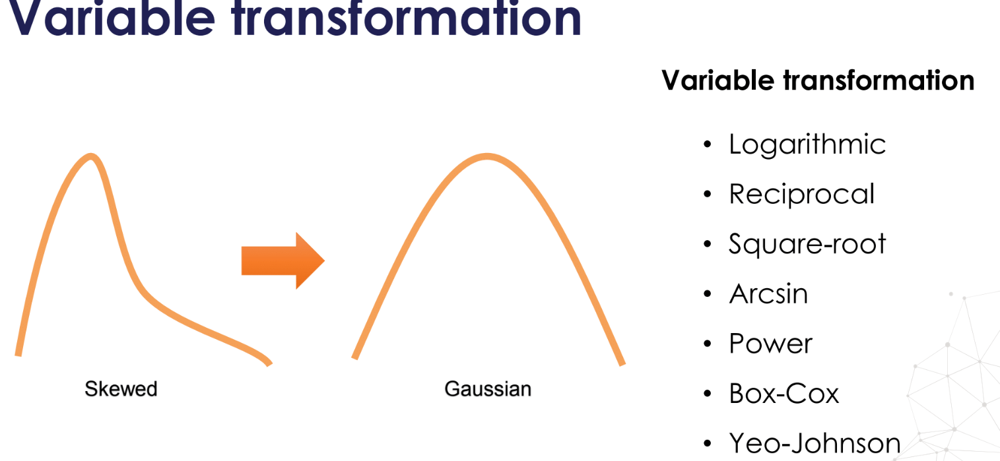

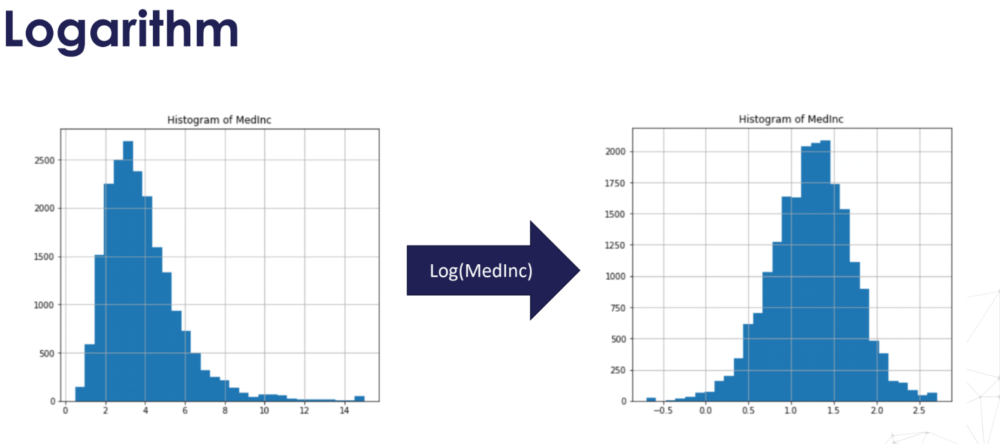

**NOTE**:
- Box Cox transformation Only suitable for positive variables, or those with positive values after adding a constant to them.
- Yeo Johnson Transformation Suitable for both positive or negative variables.
- Yeo Johnson Transformation is more flexible than Box Cox Transformation, as it can transform variables that have 0 or negative values


In [1]:
import numpy as np
import pandas as pd

# for plotting
import matplotlib.pyplot as plt

# for Q-Q plots
import scipy.stats as stats

# the dataset for the demo
from sklearn.datasets import fetch_california_housing

from sklearn.preprocessing import FunctionTransformer

C:\Users\User\AppData\Local\Temp\ipykernel_9452\1545020138.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [5]:
# load the California House price data from Scikit-learn
df = pd.read_csv("./Datasets/housing.csv")
# display top 5 rows
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [6]:
# Plot histogram and Q-Q plots to explore the variable distribution


def diagnostic_plots(df, variable):

    # function to plot a histogram and a Q-Q plot
    # side by side, for a certain variable

    plt.figure(figsize=(15, 6))

    # histogram
    plt.subplot(1, 2, 1)
    df[variable].hist(bins=30)
    plt.title(f"Histogram of {variable}")

    # q-q plot
    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.title(f"Q-Q plot of {variable}")

    plt.show()

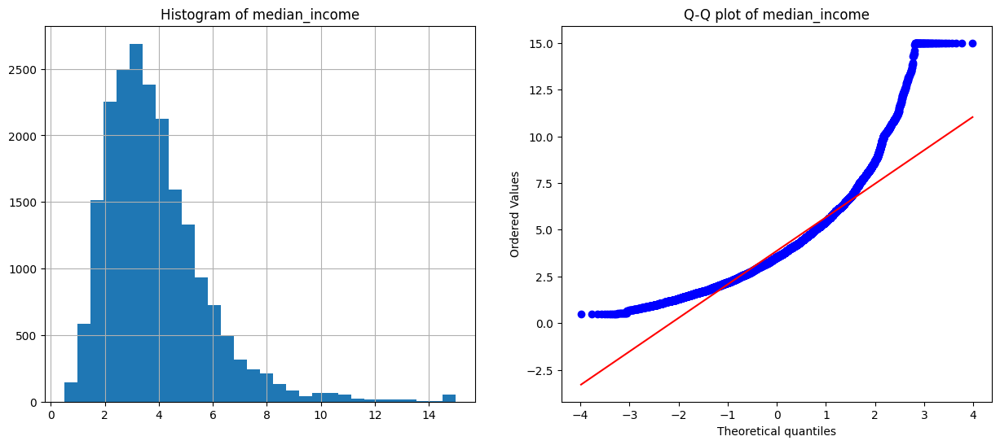

In [7]:

diagnostic_plots(df, "median_income")

In [8]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

In [14]:

variables = ['housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', ]

housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value    float64
dtype: object


g:\RajArun\BIA\.venv\lib\site-packages\sklearn\preprocessing\_function_transformer.py:192: UserWarning: The provided functions are not strictly inverse of each other. If you are sure you want to proceed regardless, set 'check_inverse=False'.
  warnings.warn(


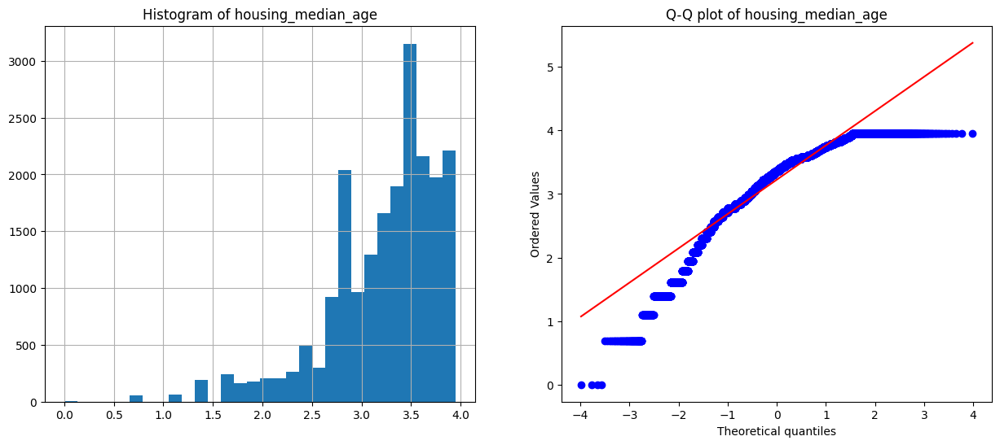

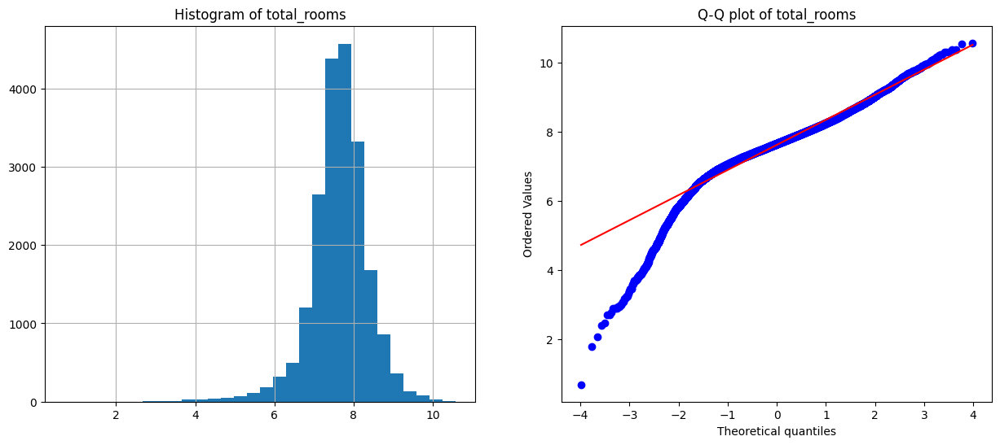

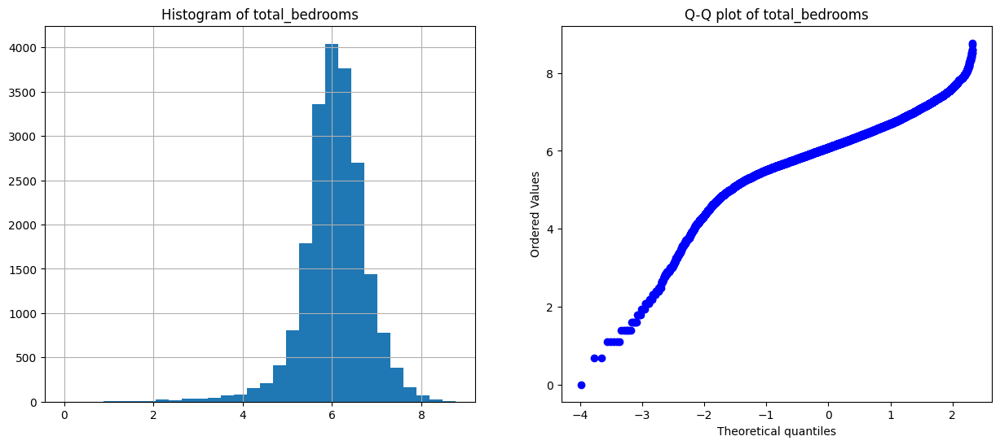

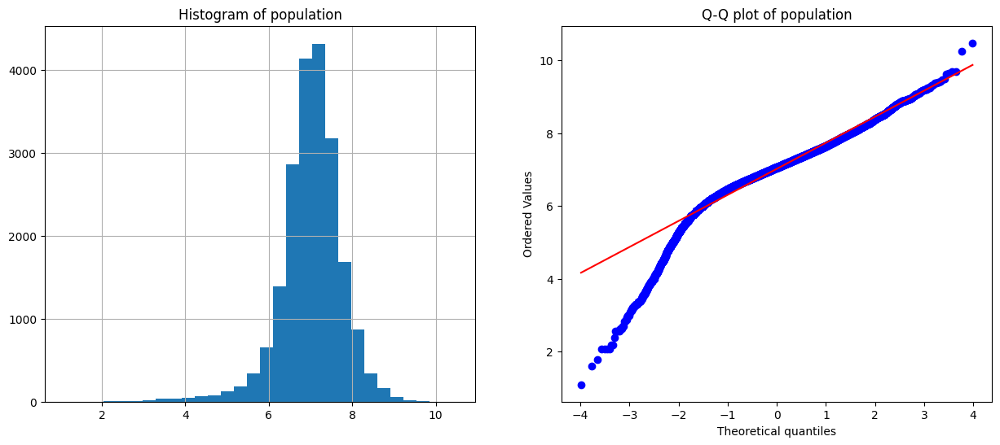

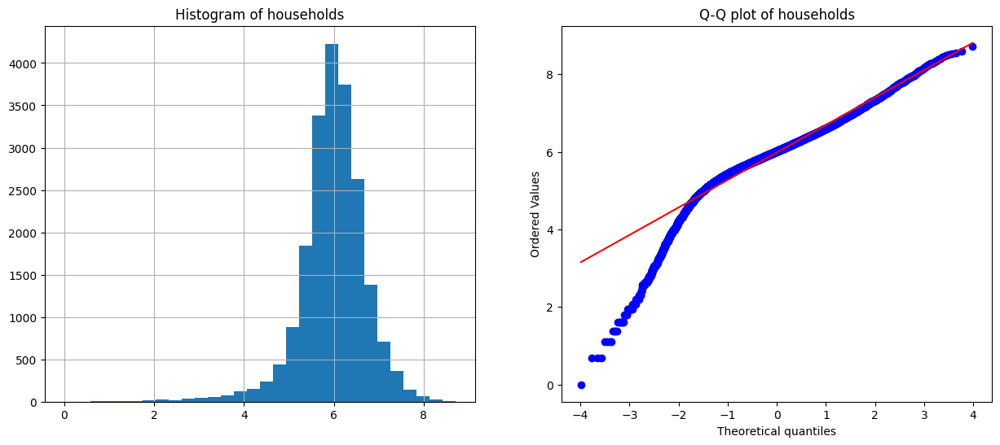

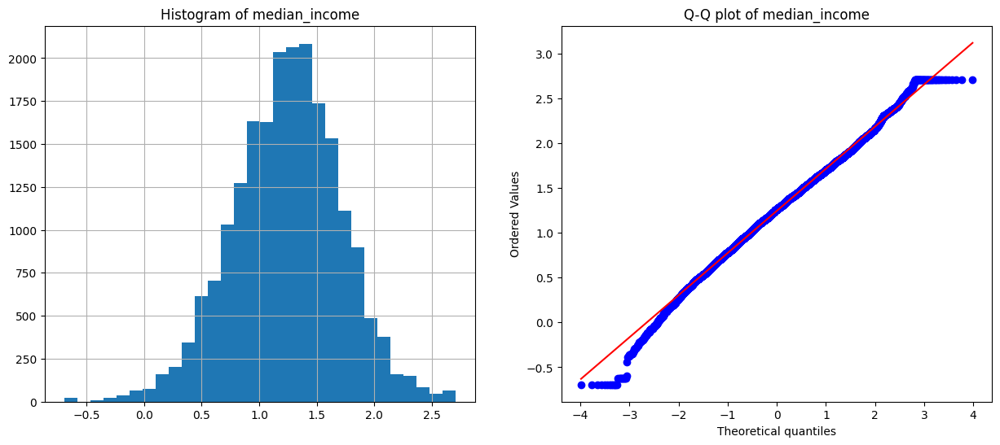

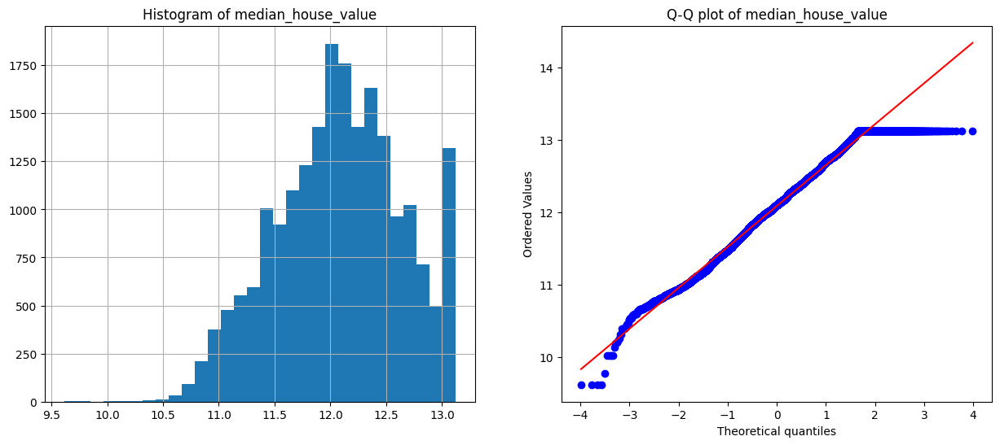

In [15]:
X_tf = df.copy()

print(X_tf[variables].dtypes)
# set up the transformer with NumPy log as parameter

transformer = FunctionTransformer(func=np.log, inverse_func=np.exp)

# fit the transformer to the train set
transformer.fit(X_tf[variables])

# transform the data
X_tf[variables] = transformer.transform(X_tf[variables])

# plot the transformed variables
for var in variables:
    diagnostic_plots(X_tf, var)



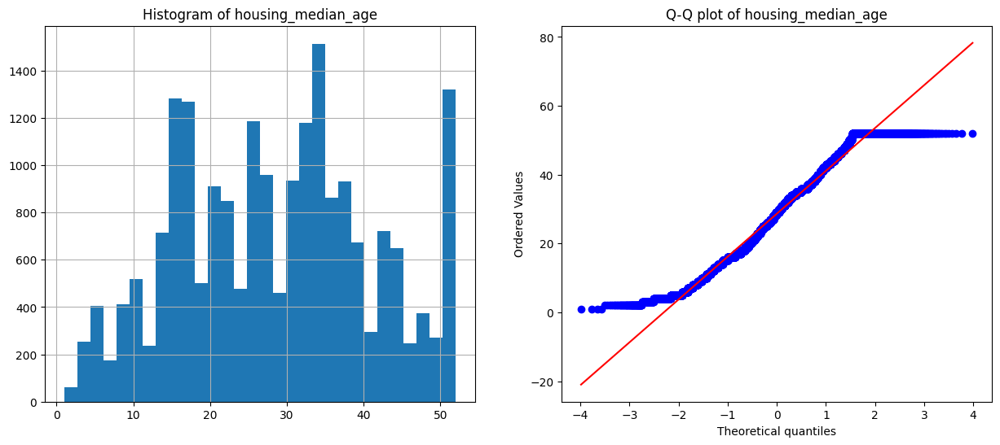

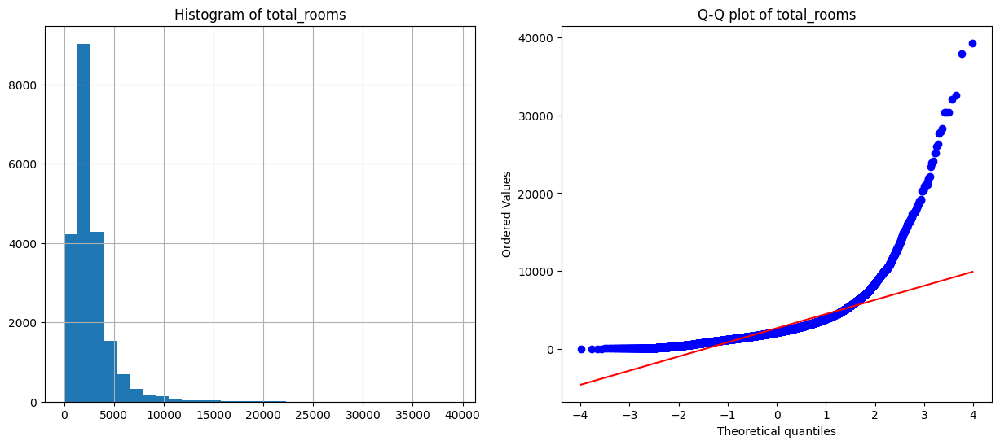

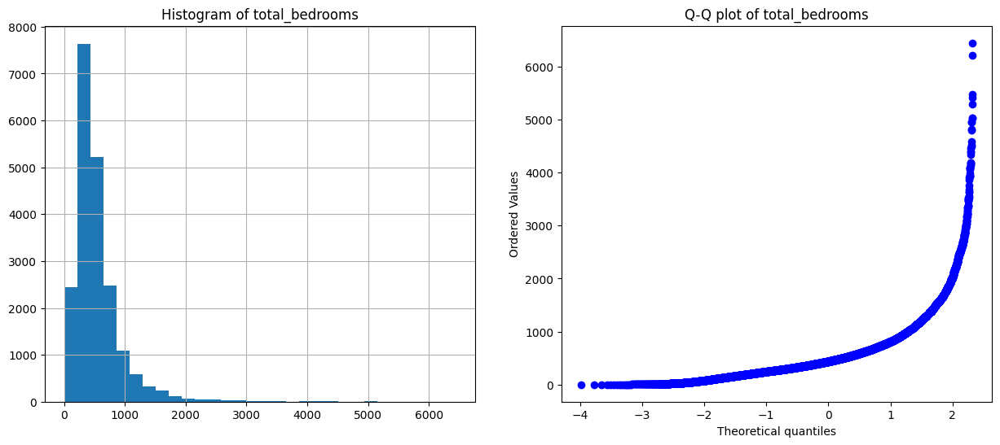

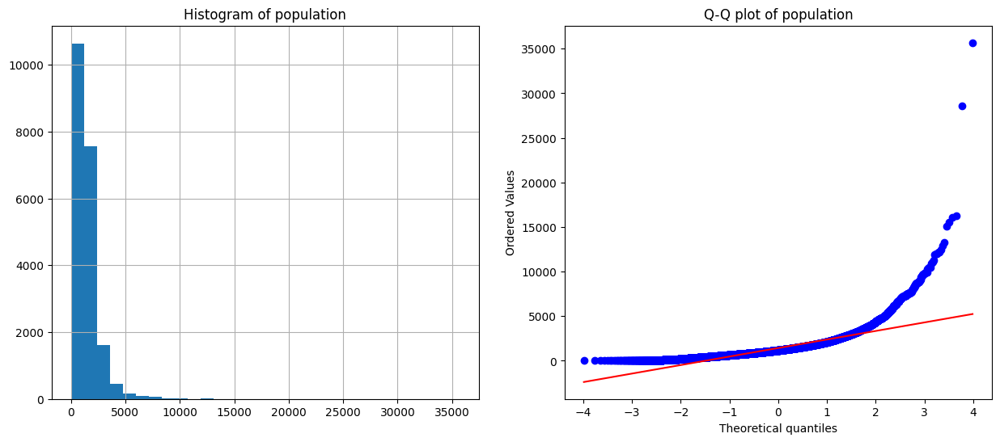

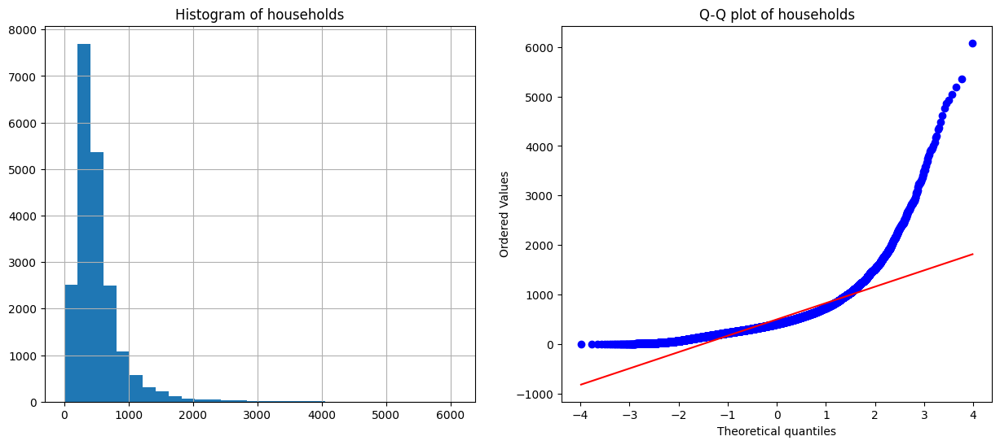

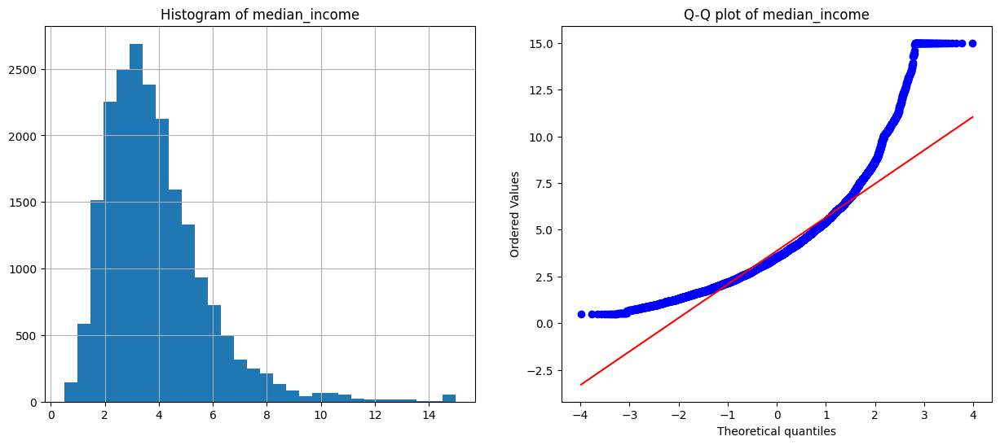

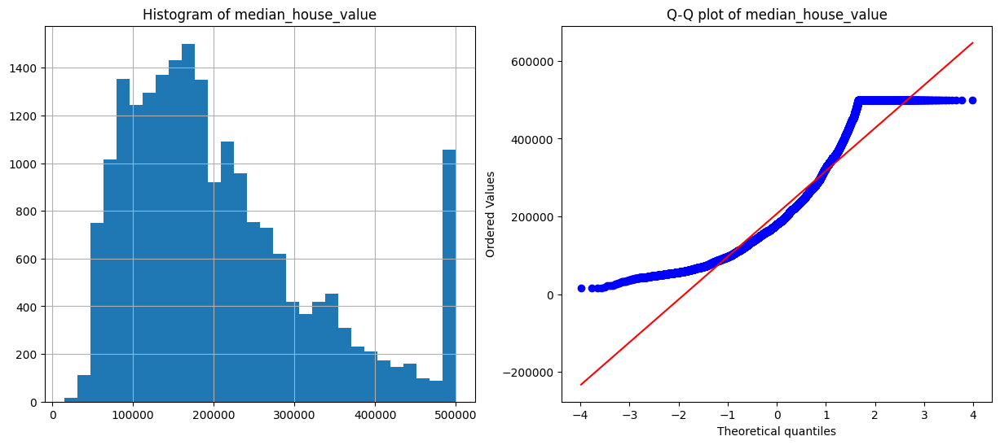

In [16]:
#invert to original scale
X_tf[variables] = transformer.inverse_transform(X_tf[variables])

# plot the transformed variables
for var in variables:
    diagnostic_plots(X_tf, var)

In [19]:
import pandas as pd

# for plotting
import matplotlib.pyplot as plt

# for Q-Q plots
import scipy.stats as stats


# with open-source packages
from sklearn.preprocessing import PowerTransformer



In [ ]:
X.hist(bins=30, figsize=(12, 12), layout=(3, 3))
plt.show()

In [20]:
def make_qqplot(df):

    plt.figure(figsize=(10, 6), constrained_layout=True)

    for i in range(6):

        # location in figure
        ax = plt.subplot(2, 3, i + 1)

        # variable to plot
        var = variables[i]

        # q-q plot
        stats.probplot((df[var]), dist="norm", plot=plt)

        # add variable name as title
        ax.set_title(var)

    plt.show()

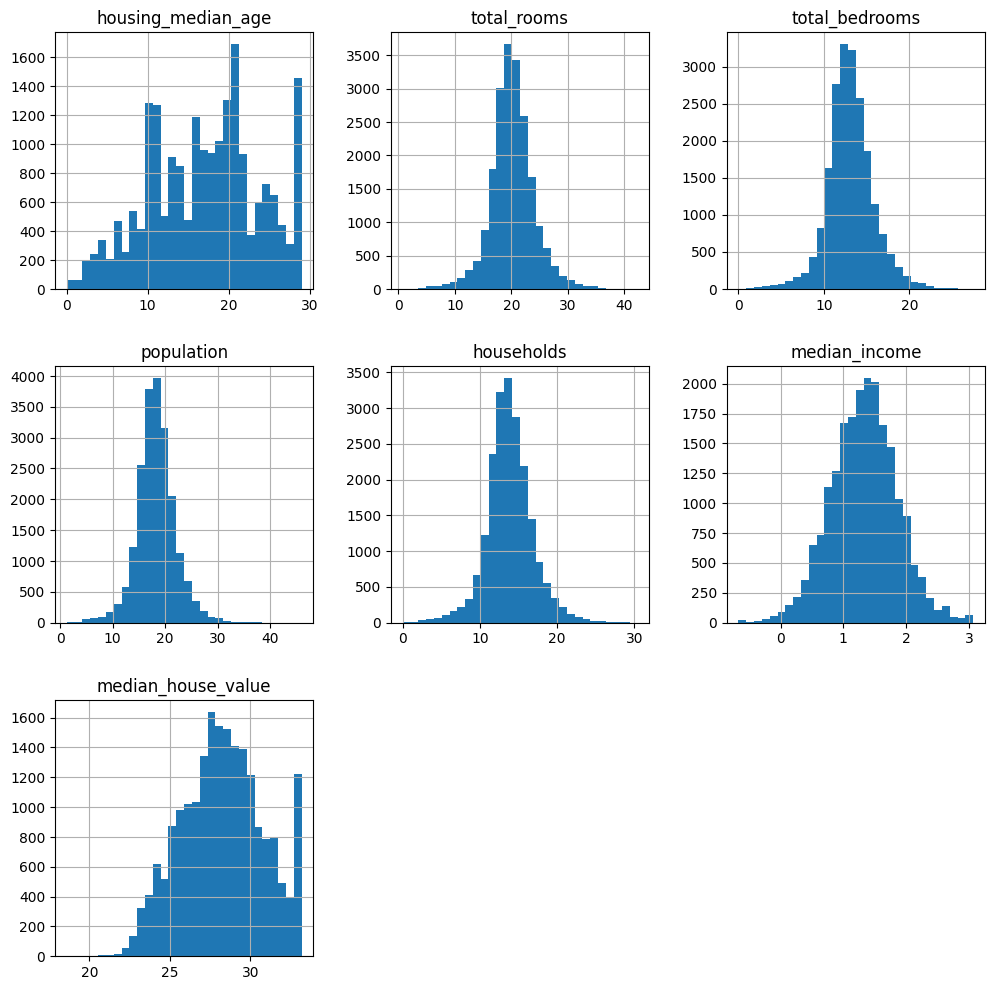

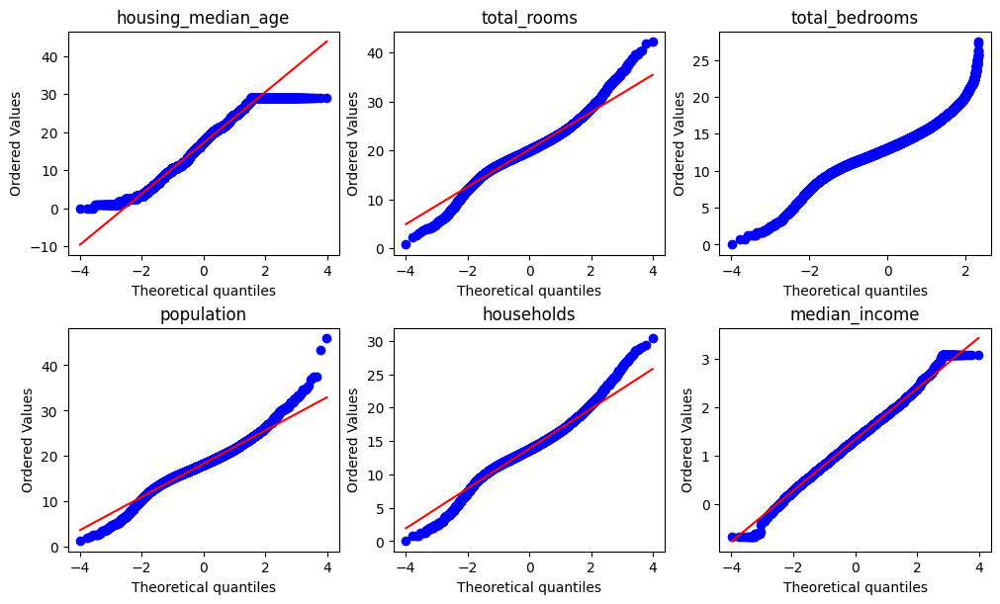

In [21]:
# initialize the transformer with box-cox

transformer = PowerTransformer(method="box-cox", standardize=False)

transformer.set_output(transform="pandas")

# fit the transformer to the train set
transformer.fit(df[variables])

# transform the data
X_tf = transformer.transform(df[variables])

# Plot histograms to inspect variable distributions

X_tf.hist(bins=30, figsize=(12, 12), layout=(3, 3))
plt.show()

# plot the transformed variables
make_qqplot(X_tf)


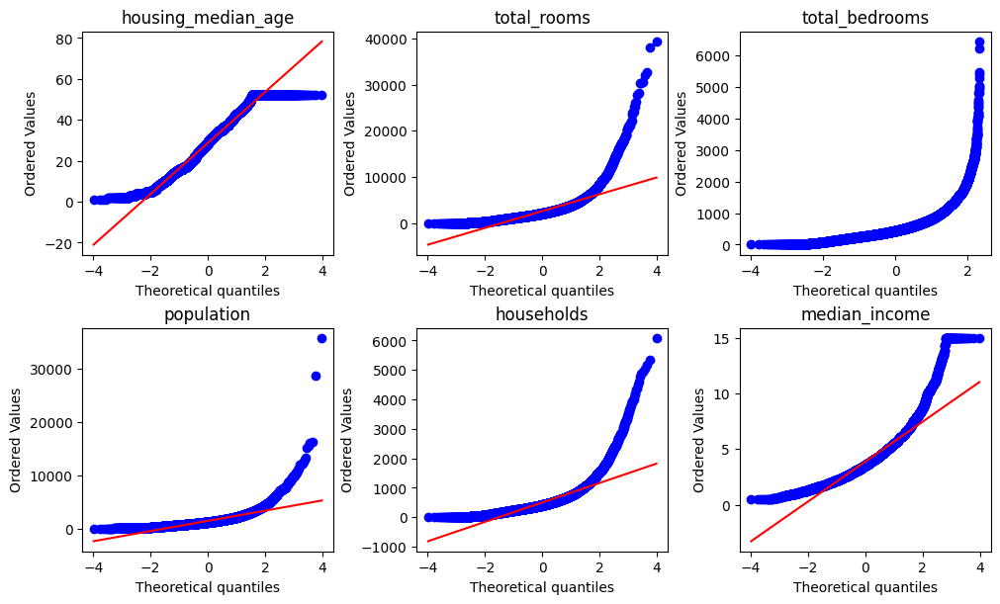

In [22]:
make_qqplot(df[variables])

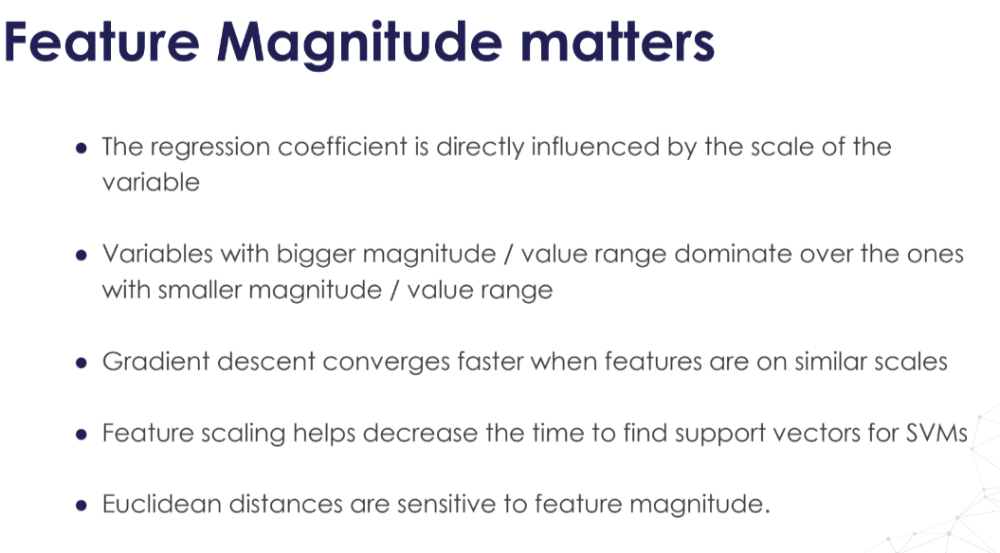

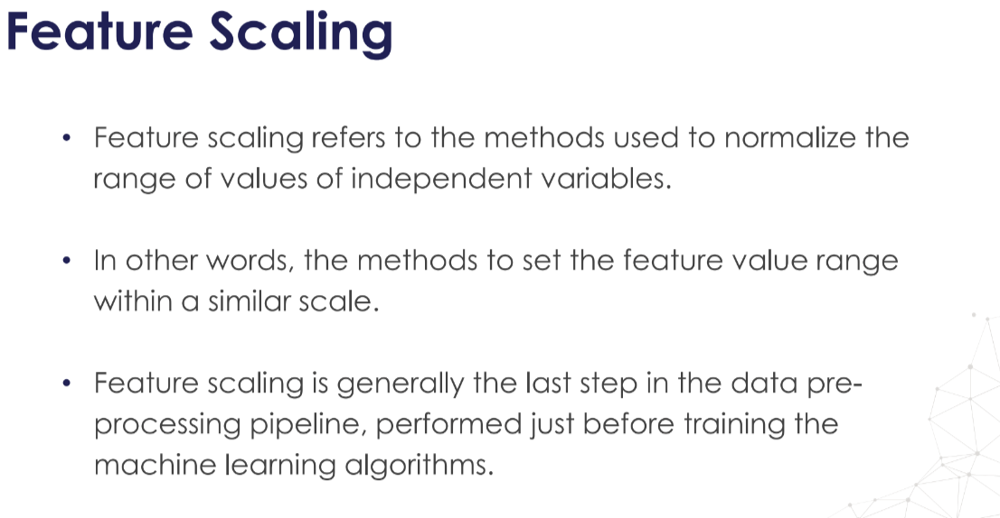

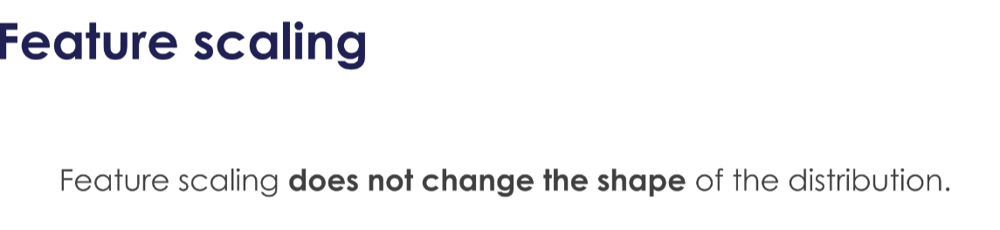

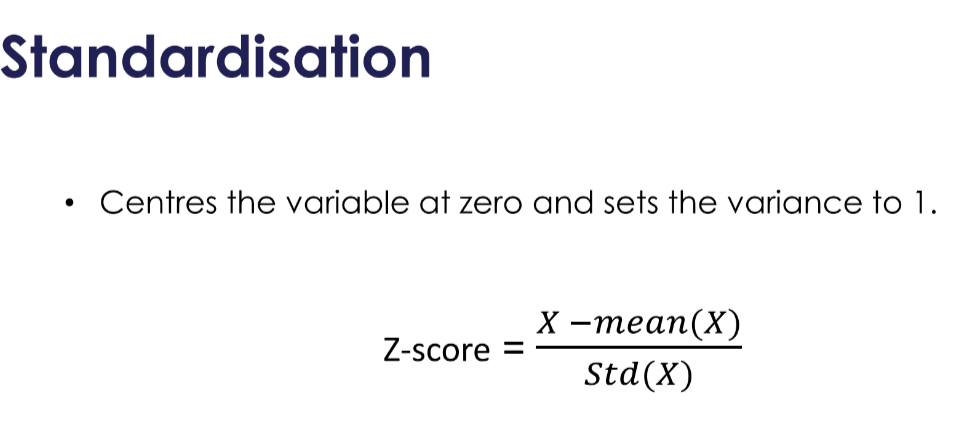

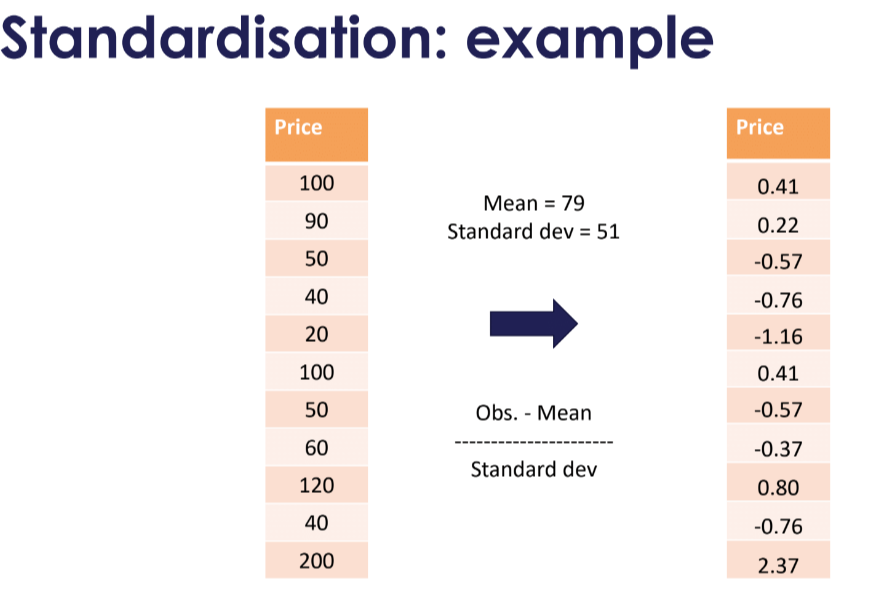

...

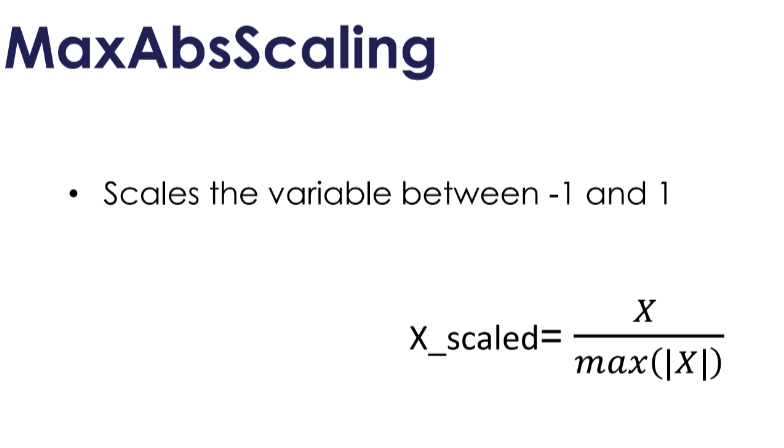

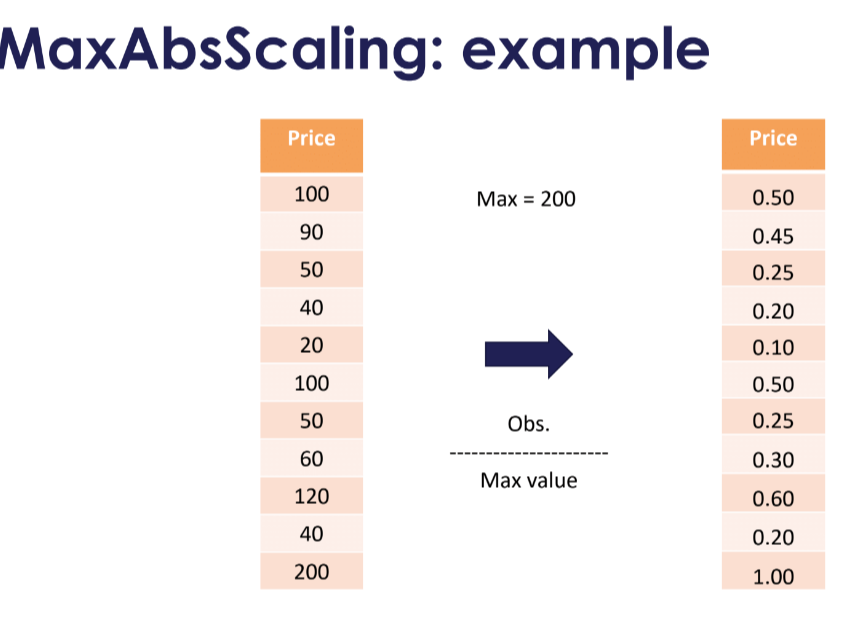

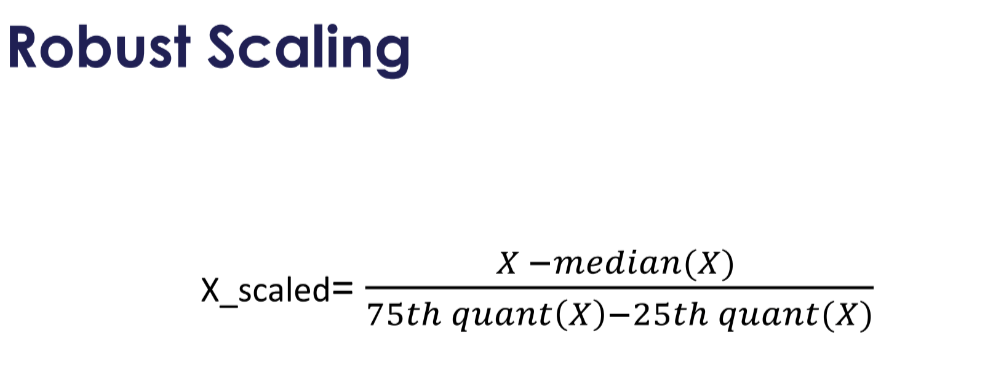

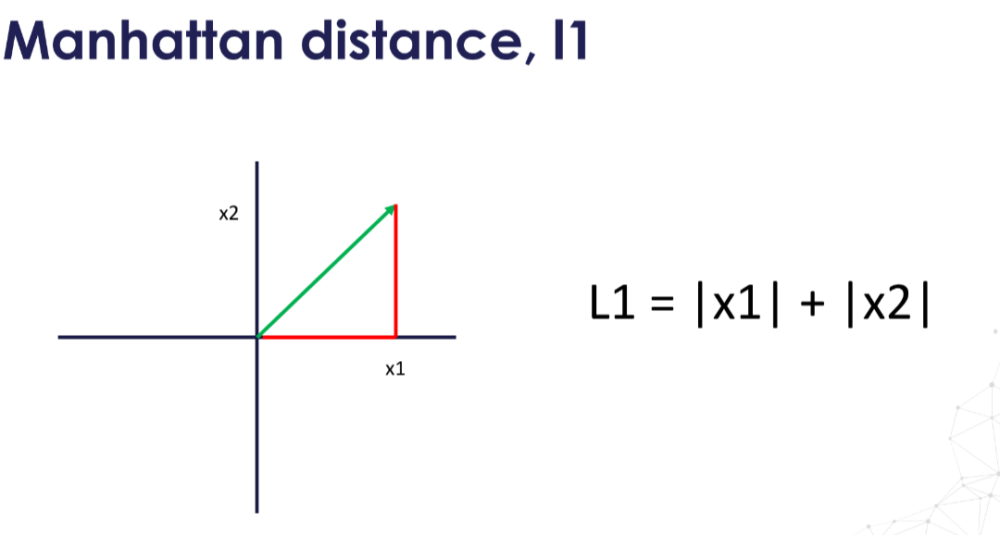

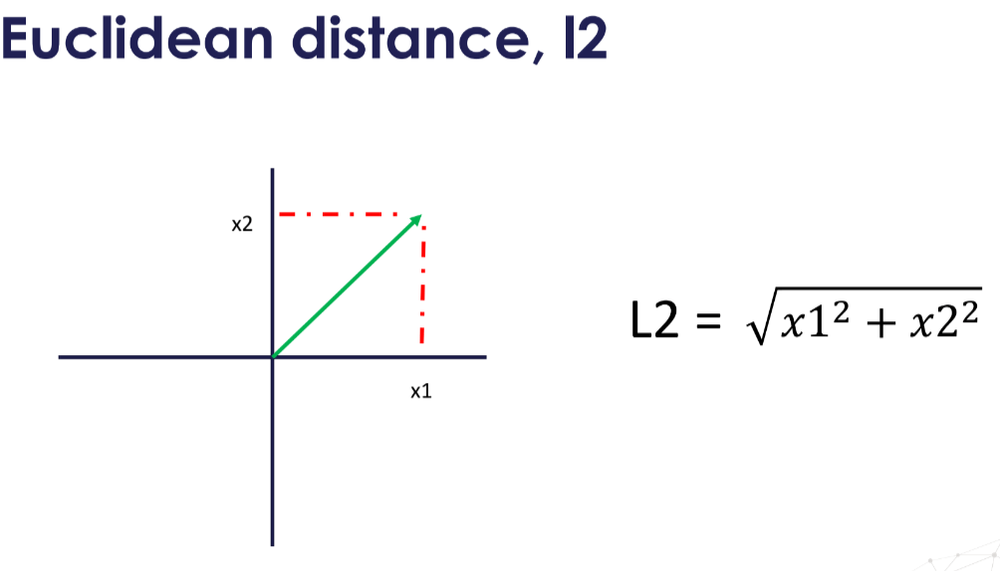

In [23]:
df.sample(5)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
6986,-118.03,33.97,39.0,1996.0,389.0,1029.0,387.0,4.6500,224300.0,<1H OCEAN
13911,-116.22,34.21,23.0,1175.0,468.0,355.0,151.0,2.2083,42500.0,INLAND
13585,-117.30,34.12,43.0,1018.0,261.0,736.0,215.0,2.6000,66900.0,INLAND
14272,-117.12,32.70,37.0,1361.0,348.0,1398.0,328.0,1.1681,78100.0,NEAR OCEAN
18998,-121.96,38.34,14.0,3035.0,680.0,1597.0,663.0,3.6036,143500.0,INLAND


In [24]:
variables

['housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_income',
 'median_house_value']

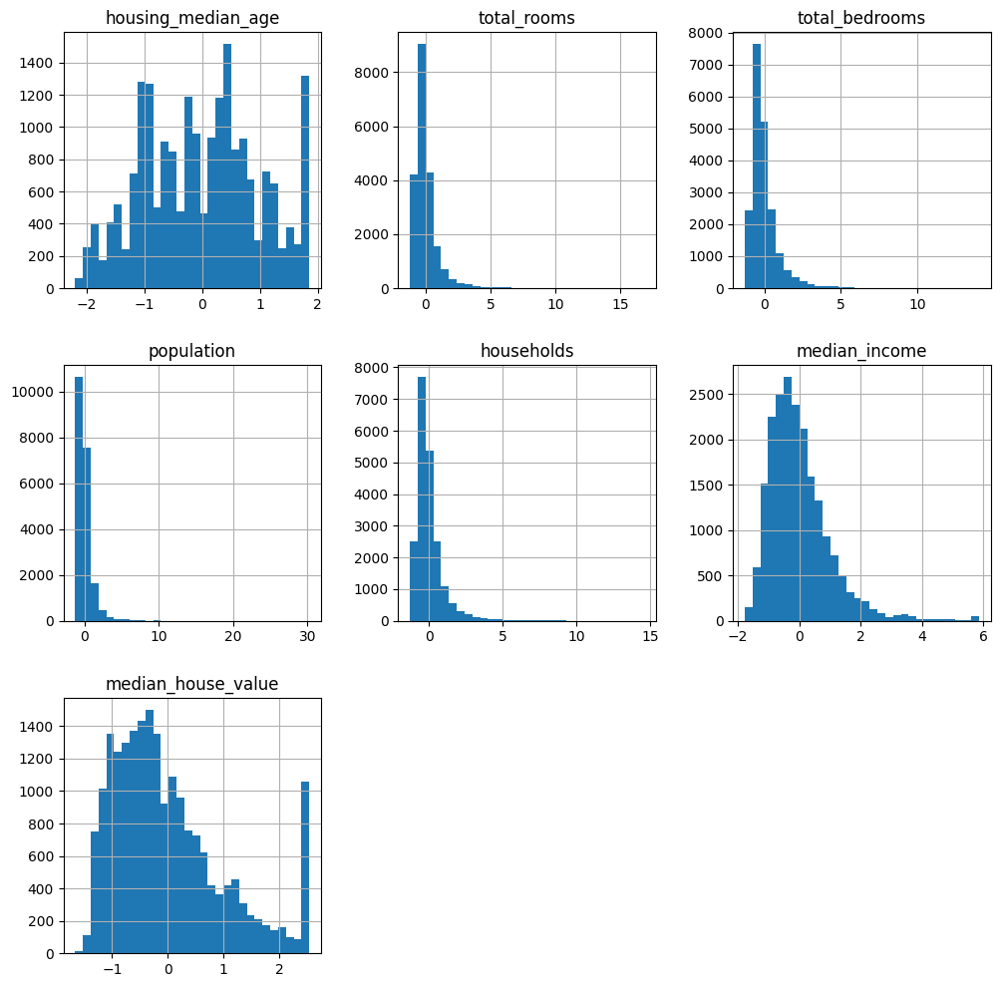

In [27]:
from sklearn.preprocessing import StandardScaler
# set up the scaler
scaler = StandardScaler().set_output(transform="pandas")
df_scaled = scaler.fit_transform(df[variables])

# plot histograms
df_scaled.hist(bins=30, figsize=(12, 12), layout=(3, 3))
plt.show()


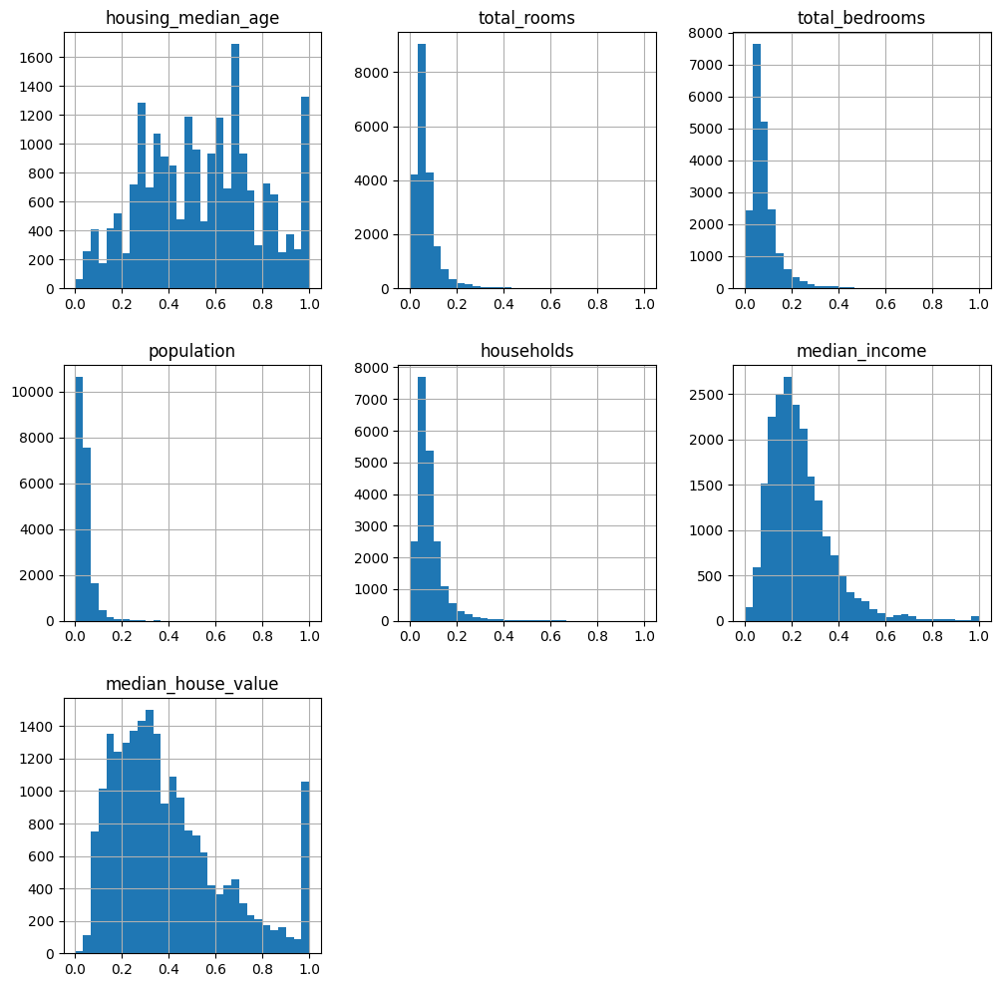

In [29]:
from sklearn.preprocessing import MinMaxScaler

# set up the scaler
scaler = MinMaxScaler().set_output(transform="pandas")
df_scaled = scaler.fit_transform(df[variables])

# plot histograms
df_scaled.hist(bins=30, figsize=(12, 12), layout=(3, 3))
plt.show()

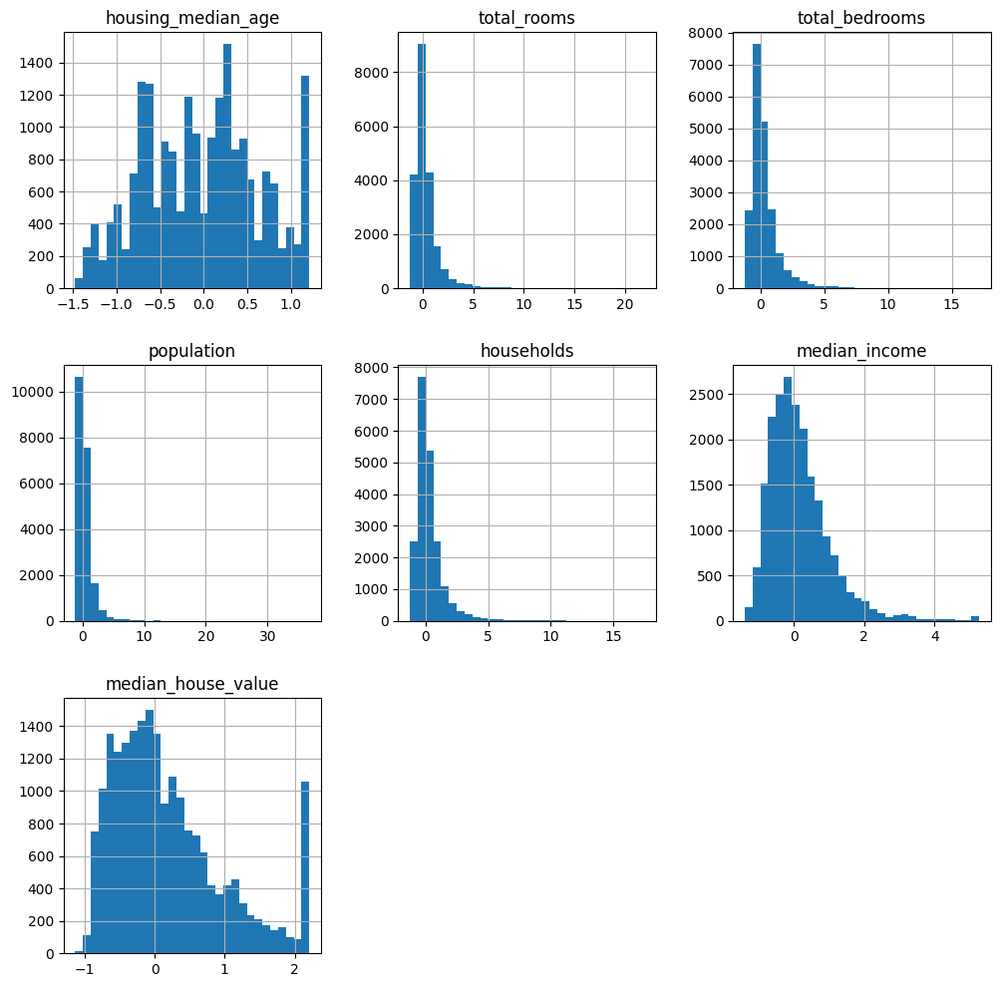

In [31]:
from sklearn.preprocessing import RobustScaler

# set up the scaler
scaler = RobustScaler().set_output(transform="pandas")
df_scaled = scaler.fit_transform(df[variables])

# plot histograms
df_scaled.hist(bins=30, figsize=(12, 12), layout=(3, 3))
plt.show()

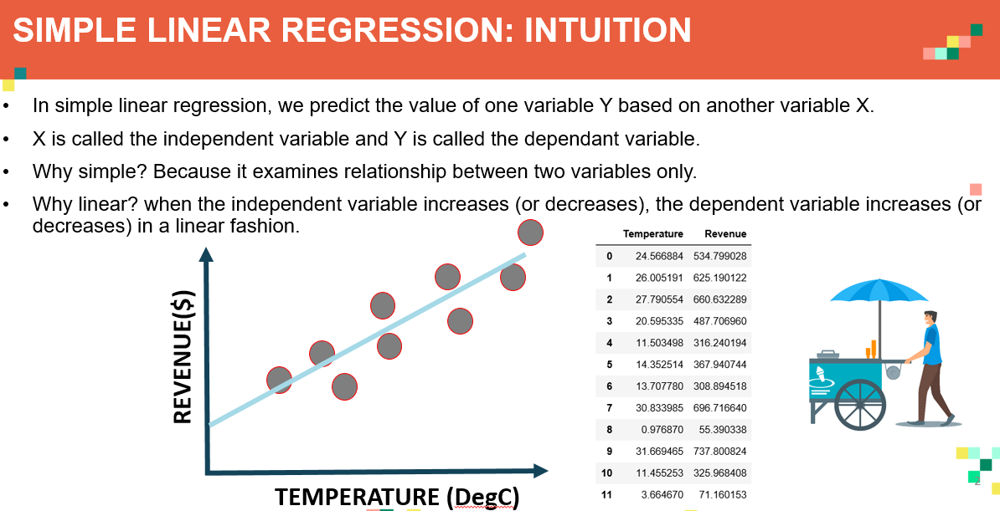

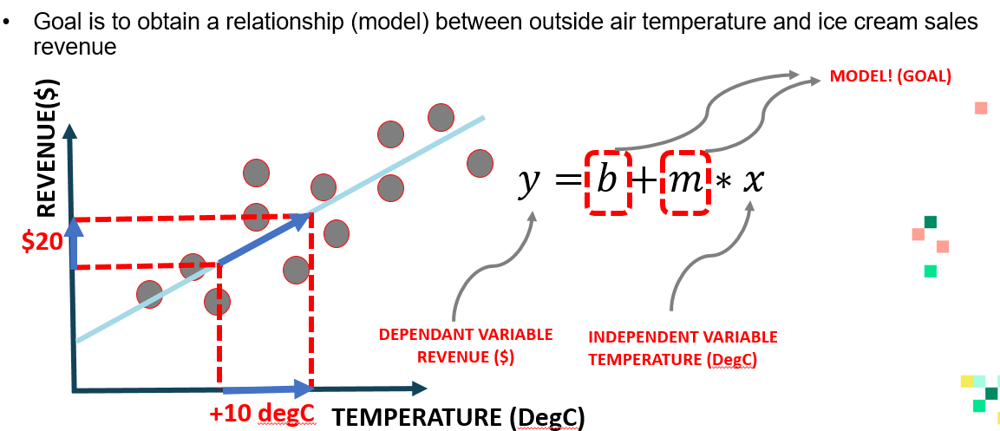

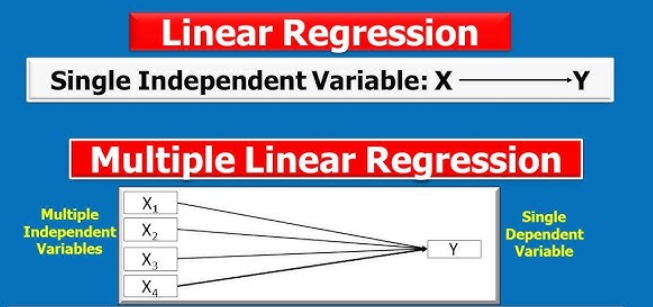

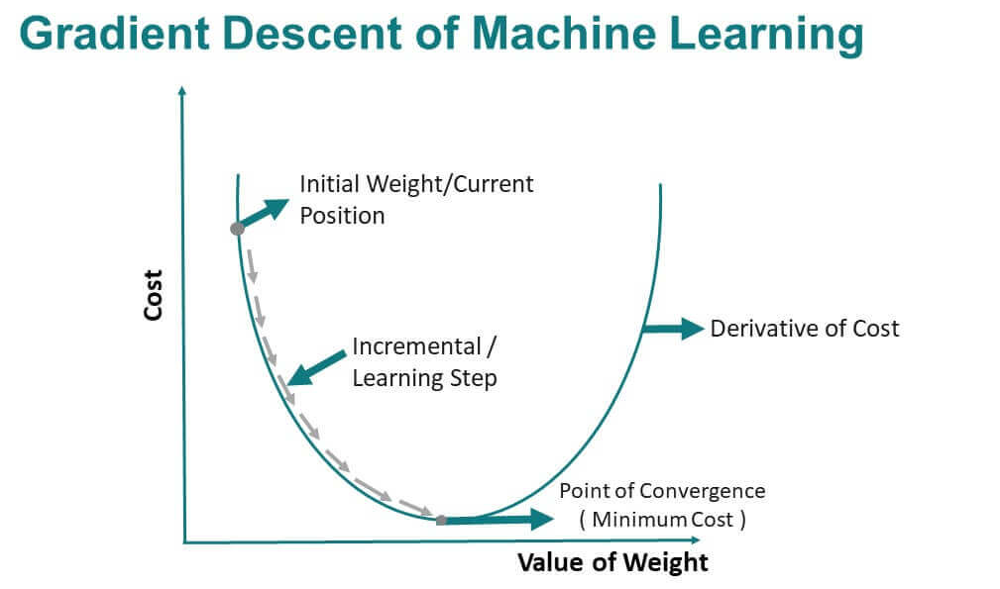